This is  simple notebook to investigate sonification with Python.
The reference can be found here [ 	
Jupyter at Bryn Mawr College: Sonification ](https://jupyter.brynmawr.edu/services/public/dblank/jupyter.cs/Sonification.ipynb)

# **White Noise**

In [1]:
import numpy as np
import matplotlib.pyplot as plt

def noise50(t):
    return 0.5 * np.random.uniform(-1, 1)

def noise75(t):
    return 0.75 * np.random.uniform(-1, 1)


print("noise75(576457465476): ", noise75(576457465476))
print("noise50(0): ", noise50(0))


noise75(576457465476):  0.3140564924138291
noise50(0):  0.14994166510626972


However, even before we begin to use these, we notice that there is a lot of repeated code. We could actually use our computational skills to abstract these into a function that creates functions:

In [2]:
def make_noise(amplitude=0.5):
    def f(t):
        return amplitude * np.random.uniform(-1, 1)
    return f

noise50 = make_noise(0.5)
noise10 = make_noise(0.1)

print("noise50(0): ", noise50(0))
print("noise10(0): ", noise10(0))

noise50(0):  -0.37370379620070626
noise10(0):  -0.021588174773015292




Now, let's make a lot of noise!

We will use the standard of 44,100 data values per second, as most hardware can support that format.

We use Python's list comprehension to make a list of random values:


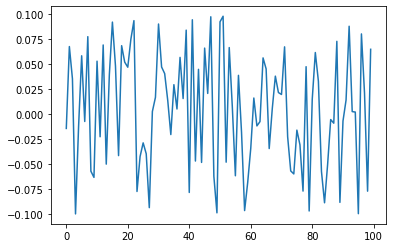

In [3]:
data = [noise10(t) for t in np.arange(0, 5, 1/44100)]
# First, let's take a look at some of the data, the first 100 values (the plot command is part of matplotlib we 
# we activated using %pylab inline magic):

plt.plot(data[:100])

PLAY SOUND!!!!!

In [4]:
import IPython.display as ipd
ipd.Audio(data, rate=44100, autoplay=True)

# Check out https://stackoverflow.com/questions/61573928/using-ipython-display-audio-to-play-audio-in-jupyter-notebook-not-working-when-u

Here's a something a little different

In [5]:
# Audio can also take a two-dimensional array of numbers to create stereo audio.
data2 = [noise50(t) for t in np.arange(0, 5, 1/44100)]
ipd.Audio([data, data2], rate=44100)


# **Now here's some other cool shit**

 Perlin Noise - check this out https://en.wikipedia.org/wiki/Perlin_noise


*We're going to use use open source code for generating the Perlin Noise. In fact, we will automate getting the code in this notebook as well. We use the ! symbol to indicate that this is a shell command:*



In [6]:
! wget https://raw.githubusercontent.com/caseman/noise/master/perlin.py 



--2022-04-04 01:51:36--  https://raw.githubusercontent.com/caseman/noise/master/perlin.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12249 (12K) [text/plain]
Saving to: ‘perlin.py.1’

perlin.py.1         100%[===================>]  11.96K  --.-KB/s    in 0s      

2022-04-04 01:51:36 (69.7 MB/s) - ‘perlin.py.1’ saved [12249/12249]



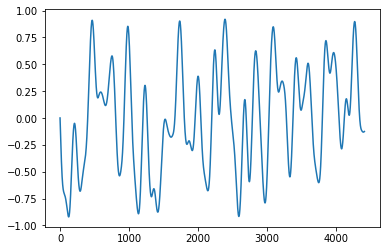

In [7]:
from perlin import *
ngen = SimplexNoise()
#%%time
data = [ngen.noise2(t/200, 0) for t in np.arange(0, 44100 * 5)]
plt.plot(data[:4410])

In [8]:
ipd.Audio(data, rate=44100)

# **Let's make some music BAY-BAY**

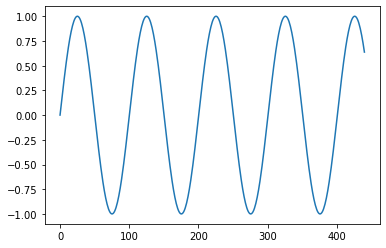

In [9]:
def make_tone(frequency):
    def f(t):
        return np.math.sin(2 * np.math.pi * frequency * t)
    return f

tone440 = make_tone(440)
plt.plot([tone440(t) for t in np.arange(0, .01, 1/44100)])

In [10]:
ipd.Audio([tone440(t) for t in np.arange(0, 5, 1/44100)], rate=44100)

# **Binaural beats**

In [11]:
tone220 = make_tone(220)
tone221 = make_tone(221)
data220 = [tone220(t) for t in np.arange(0, 5, 1/44100)]
data221 = [tone221(t) for t in np.arange(0, 5, 1/44100)]
ipd.Audio([data220, data221], rate=44100)

In [12]:
def array_add(a1, a2):
    return [a1[i] + a2[i] for i in range(len(a1))]

ipd.Audio(array_add(data220, data221), rate=44100)

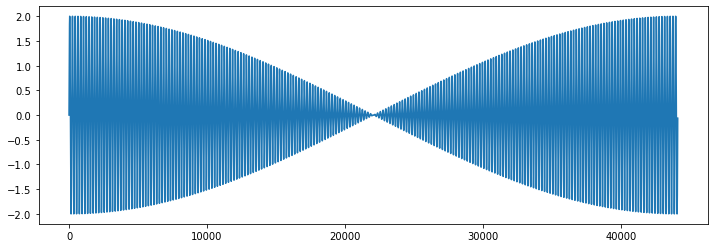

In [13]:
# (6.0, 4.0)
plt.rcParams["figure.figsize"] = (12.0, 4.0)
plt.plot(array_add(data220, data221)[:44100])

In [14]:
plt.rcParams["figure.figsize"] = (6.0, 4.0)
tone300 = make_tone(300)
tone310 = make_tone(310)
data300 = [tone300(t) for t in np.arange(0, 5, 1/44100)]
data310 = [tone310(t) for t in np.arange(0, 5, 1/44100)]
ipd.Audio([data300, data310], rate=44100)

# **Array-based Mathematics**

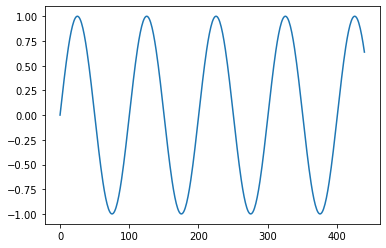

In [15]:
framerate = 44100
t = np.linspace(0, 5, framerate * 5)
tone = np.sin(2 * np.pi * 440 * t)
plt.plot(tone[:441])

In [16]:
ipd.Audio(tone, rate=framerate)

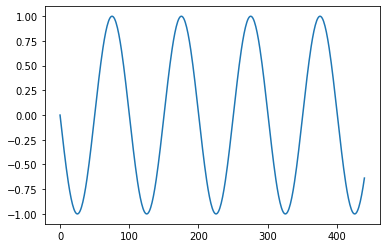

In [17]:
antitone = np.sin(2 * np.pi * 440 * t + np.pi)
plt.plot(antitone[:441])

In [18]:
ipd.Audio(antitone, rate=framerate)

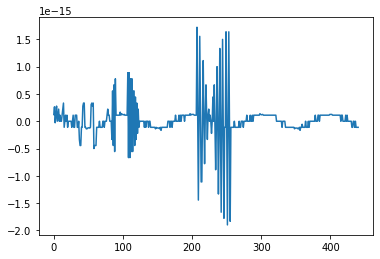

In [19]:
plt.plot((tone + antitone)[:441])

In [20]:
ipd.Audio(tone + antitone, rate=framerate)

In [21]:
ipd.Audio(tone + antitone, rate=framerate, autoplay=True)

# **Sequence of Tones**

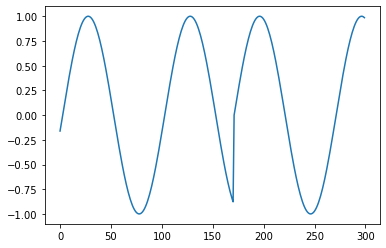

In [22]:
framerate = 44100
t = np.linspace(0, 5, framerate * 5)
chunk = np.sin(2 * np.pi * 440 * t)
data = np.array(0)
for i in range((44100 * 5)//870 + 1):
    data = np.append(data, chunk[:870])

plt.plot(data[700:1000])

In [23]:
ipd.Audio(data, rate=44100)

To make smooth transitions between two tones (or even the same tone) we need to keep track of where we are in the sine curve.

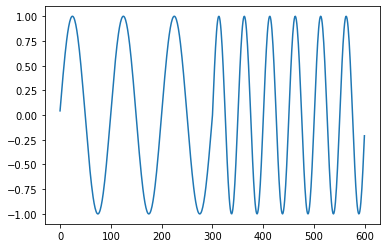

In [24]:
def make_tone(t, frequency):
    return np.math.sin(2 * np.math.pi * frequency * t)

data = []
freq = 220
for t in np.arange(0, 5, 1/44100):
    if t % 1.0 == 0:
        freq = freq * 2
    data.append(make_tone(t, freq))

# Now we look at the transition point between two tones:
plt.plot(data[44100 - 300:44100 + 300])

Nice and smooth! Notice that doubling the frequency exactly raises the tone to the next octave.

In [25]:
ipd.Audio(data, rate=44100)

Just as a double check, we can look at the spectrogram of the resulting sound:

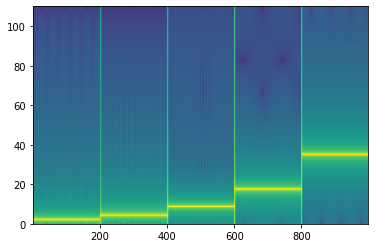

In [26]:
# https://matplotlib.org/stable/gallery/images_contours_and_fields/specgram_demo.html
# create a transient "chirp"
# s2[t <= 10] = s2[12 <= t] = 0
#
# add some noise into the mix
# nse = 0.01 * np.random.random(size=len(t))
#
# x = s1 + s2 + nse  # the signal
# NFFT = 1024  # the length of the windowing segments
# Fs = int(1.0 / dt)  # the sampling frequency
#
# fig, (ax1, ax2) = plt.subplots(nrows=2)
# ax1.plot(t, x)
# Pxx, freqs, bins, im = ax2.specgram(x, NFFT=NFFT, Fs=Fs, noverlap=900)
# The `specgram` method returns 4 objects. They are:
# - Pxx: the periodogram
# - freqs: the frequency vector
# - bins: the centers of the time bins
# - im: the .image.AxesImage instance representing the data in the plot
power, freqs, bins, im = plt.specgram(data, 1024,220)

# **Random Tones**

In [27]:
ngen = SimplexNoise()

data = []
for t in np.arange(0, 44100 * 5):
    freq = ngen.noise2(t/700000, 0) * 800 + 800
    data.append(make_tone(t, freq))

ipd.Audio(data, rate=44100)

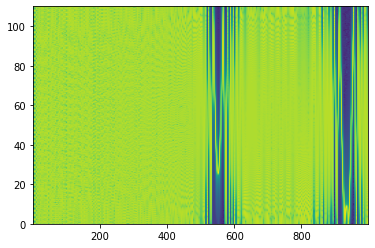

In [28]:
power, freqs, bins, im = plt.specgram(data, 1024,220)

# **Sonification: Listening to Climate Change**
[Classroom Activity -Graphing Global Temperature Trends](https://www.jpl.nasa.gov/edu/teach/activity/graphing-global-temperature-trends/)


In [29]:
import csv
# https://stackoverflow.com/questions/48340341/how-to-read-csv-to-dataframe-in-google-colab
# https://colab.research.google.com/drive/1JmwtF5OmSghC-y3-BkvxLan0zYXqCJJf
# https://stackoverflow.com/questions/61573928/using-ipython-display-audio-to-play-audio-in-jupyter-notebook-not-working-when-u
# https://matplotlib.org/stable/gallery/images_contours_and_fields/specgram_demo.html
# https://stackoverflow.com/questions/48420759/upload-local-files-using-google-colab
#test = pd.read_csv('001_global_annual_mean_temp_anomalies_land-ocean_1880-2016.csv')
#test.head()


data = []
with open("001_global_annual_mean_temp_anomalies_land-ocean_1880-2016.csv") as fp:
    for row in csv.reader(fp):
        data.append(row)

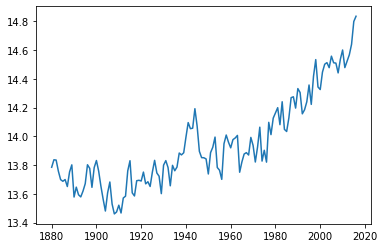

In [30]:
time = [int(row[0]) for row in data[1:]]
temps = [float(row[1]) for row in data[1:]]
plt.plot(time, temps)

In [31]:
len(temps)

137

In [32]:
climate_data = []
for t in np.arange(0, 5, 1/44100):
    temp_index = floor(t/5.0 * len(temps))
    ratio = (temps[temp_index] - min(temps))/(max(temps) - min(temps))
    climate_data.append(make_tone(t, ratio * 16000 + 400)) 

ipd.Audio(climate_data, rate=44100)

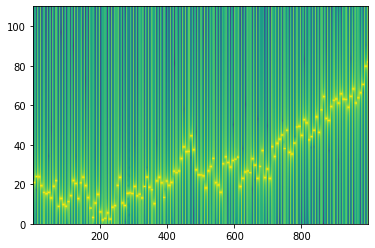

In [33]:
power, freqs, bins, im = plt.specgram(climate_data, 1024,220)

Let's try to do this with pandas!

In [34]:
import pandas as pd
test = pd.read_csv('001_global_annual_mean_temp_anomalies_land-ocean_1880-2016.csv')
test.head()

,Year,Actual Temp
0,1880,13.7852
1,1881,13.8372
2,1882,13.8352
3,1883,13.7576
4,1884,13.6991


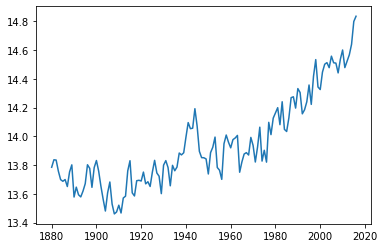

In [35]:
plt.plot(test["Year"], test["Actual Temp"])
plt.show()

In [36]:
pandas_climate_data = []
for t in np.arange(0, 5, 1/44100):
    #pandas_temp_index = floor(t/5.0 * len(temps))
    pandas_temp_index = floor(t/5.0 * len(test["Actual Temp"]))
    ratio = (test["Actual Temp"][pandas_temp_index] - min(test["Actual Temp"]))/(max(test["Actual Temp"]) - min(test["Actual Temp"]))
    pandas_climate_data.append(make_tone(t, ratio * 16000 + 400)) 

ipd.Audio(pandas_climate_data, rate=44100)

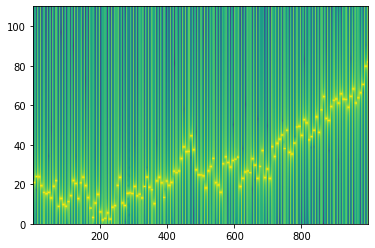

In [37]:
power, freqs, bins, im = plt.specgram(pandas_climate_data, 1024,220)